In [1]:
from typing import Union
from os.path import basename
from dateutil import parser
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from rasters import Raster
from time_conversion import calculate_hour_of_day
from STIC_sensitivity import process_STIC_table
from PTJPL_sensitivity import process_PTJPL_table
from PTJPL.Topt import load_Topt
from PTJPL.fAPARmax import load_fAPARmax
from SEBAL import process_SEBAL_G_table
from HLS import HLS2SentinelGranule
from sensitivity import perturbed_run, joint_perturbed_run
%matplotlib inline

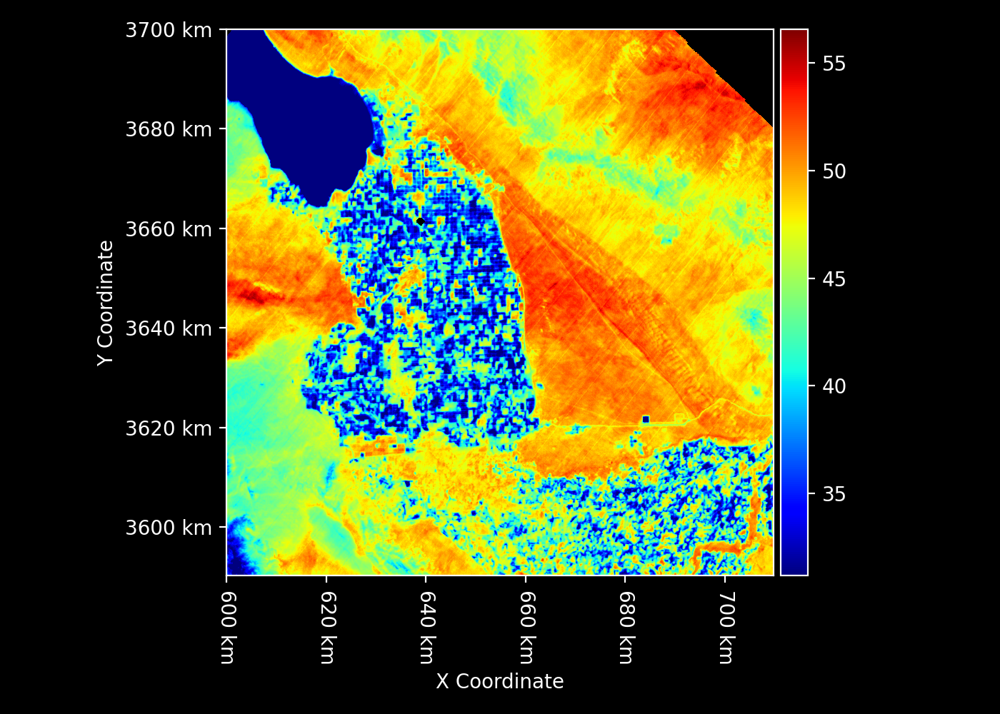

In [2]:
ST_C_filename = "example_ECOSTRESS_input/ECOv002_L2T_LSTE_21485_013_11SPS_20220420T211350_0601_01/ECOv002_L2T_LSTE_21485_013_11SPS_20220420T211350_0601_01_LST.tif"
ST_C = Raster.open(ST_C_filename) - 273.15
ST_C

In [3]:
geometry = ST_C.geometry
geometry

{
  "dimensions": {
    "rows": 1568,
    "cols": 1568
  },
  "bbox": {
    "xmin": 600000.0,
    "ymin": 3590260.0,
    "xmax": 709760.0,
    "ymax": 3700020.0
  },
  "crs": "EPSG:32611",
  "resolution": {
    "cell_width": 70.0,
    "cell_height": -70.0
  }
}

In [4]:
time_UTC = parser.parse(basename(ST_C_filename).split("_")[6])
time_UTC

datetime.datetime(2022, 4, 20, 21, 13, 50)

In [5]:
doy = time_UTC.timetuple().tm_yday
doy

110

/Users/halverso/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


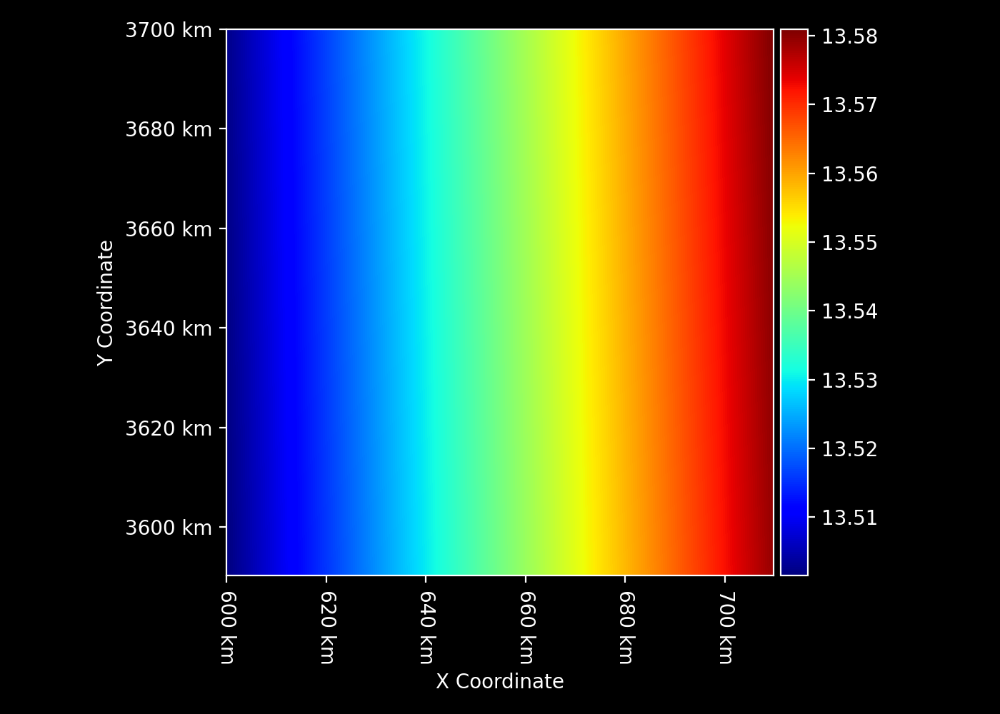

In [6]:
hour_of_day = calculate_hour_of_day(time_UTC, geometry=geometry)
hour_of_day

/Users/halverso/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


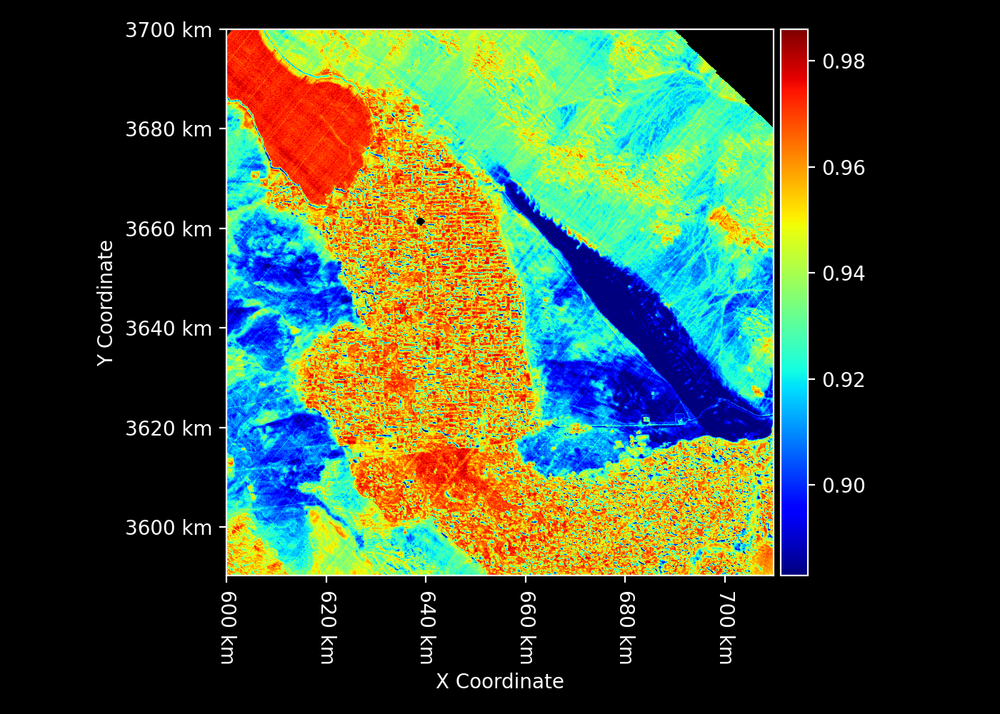

In [7]:
emissivity_filename = "example_ECOSTRESS_input/ECOv002_L2T_LSTE_21485_013_11SPS_20220420T211350_0601_01/ECOv002_L2T_LSTE_21485_013_11SPS_20220420T211350_0601_01_EmisWB.tif"
emissivity = Raster.open(emissivity_filename)
emissivity

In [8]:
sentinel = HLS2SentinelGranule("example_ECOSTRESS_input/HLS.S30.T11SPS.2022110T181909.v2.0")
# sentinel

/Users/halverso/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


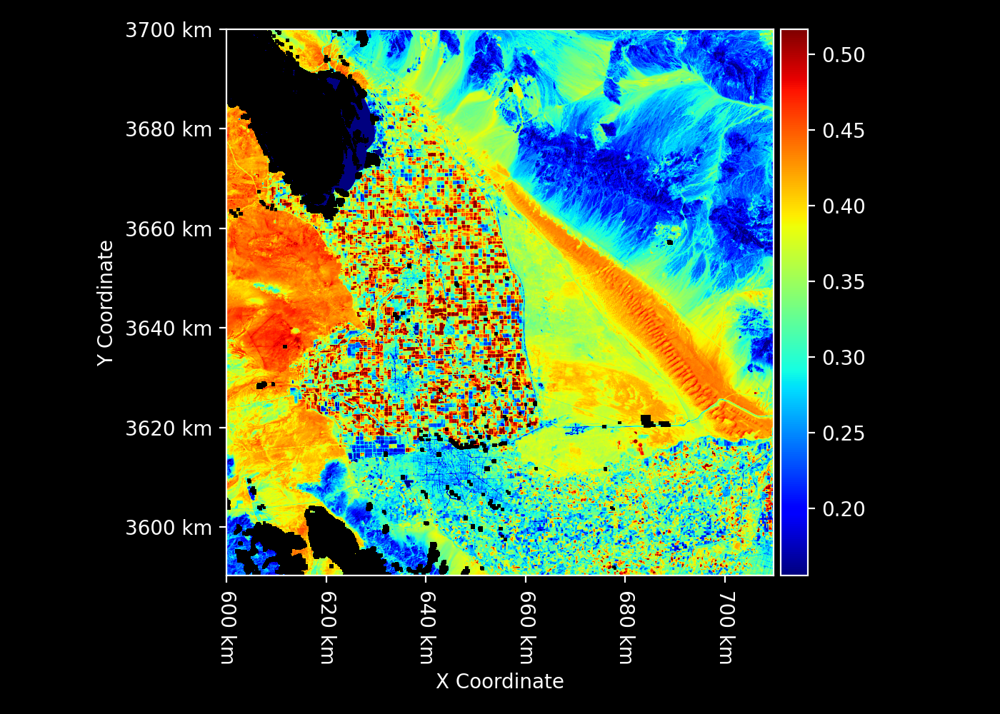

In [9]:
NIR = sentinel.NIR.to_geometry(geometry)
NIR

/Users/halverso/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


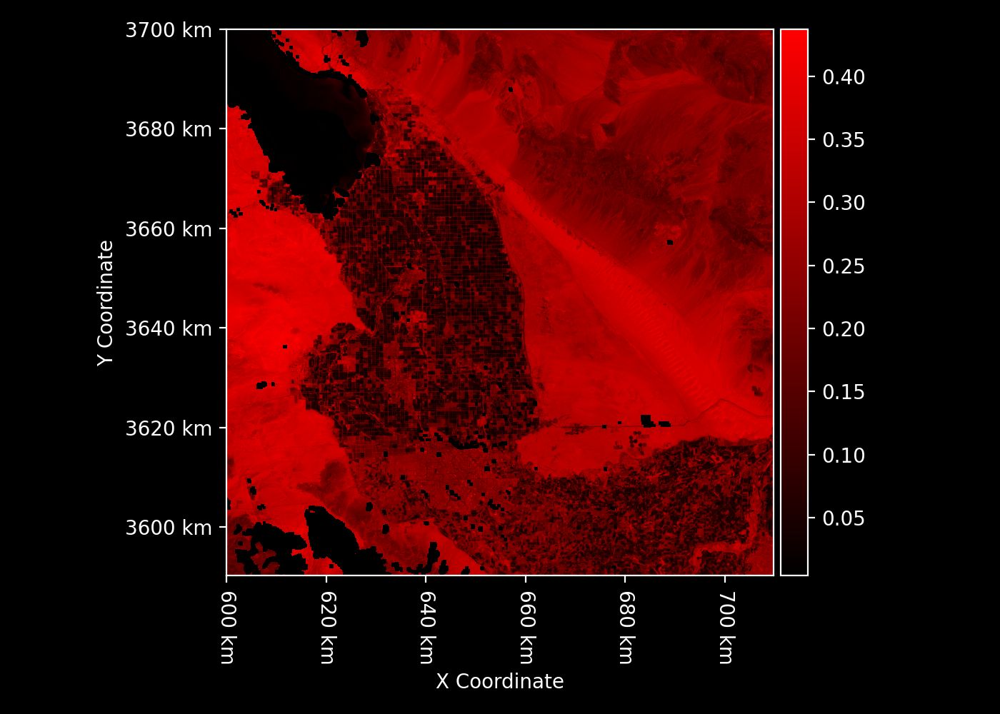

In [10]:
red = sentinel.red.to_geometry(geometry)
red

In [11]:
# NDVI_filename = "example_ECOSTRESS_input/ECOv002_L2T_STARS_21485_013_11SPS_20220420_0700_01/ECOv002_L2T_STARS_21485_013_11SPS_20220420_0700_01_NDVI.tif"
# NDVI = Raster.open(NDVI_filename)
# NDVI

/Users/halverso/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


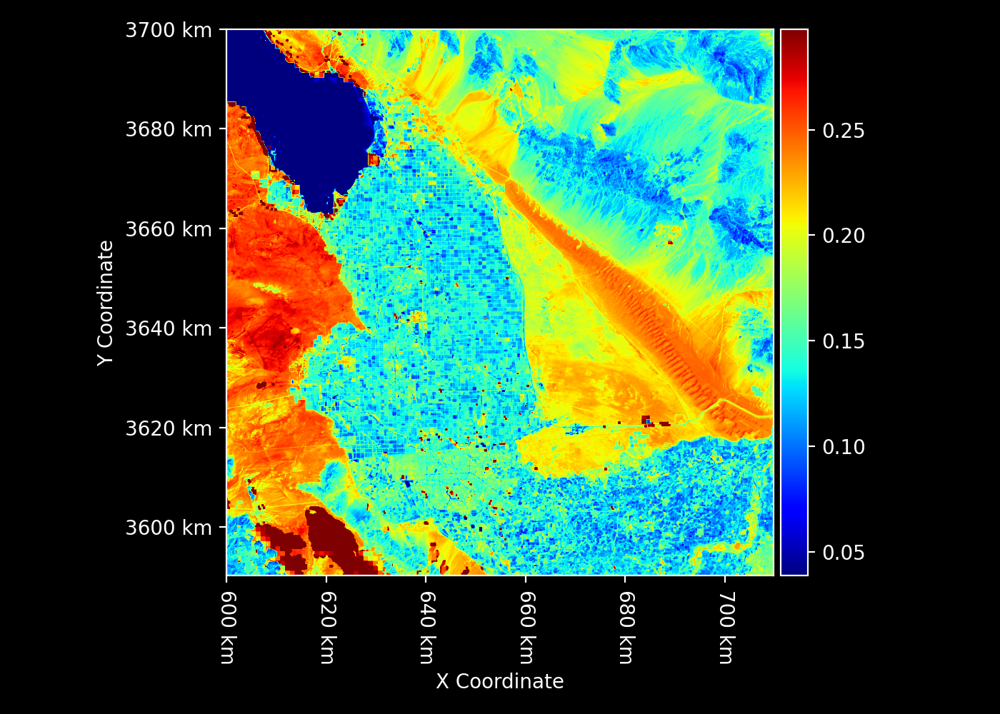

In [12]:
albedo_filename = "example_ECOSTRESS_input/ECOv002_L2T_STARS_21485_013_11SPS_20220420_0700_01/ECOv002_L2T_STARS_21485_013_11SPS_20220420_0700_01_albedo.tif"
albedo = Raster.open(albedo_filename)
albedo

/Users/halverso/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


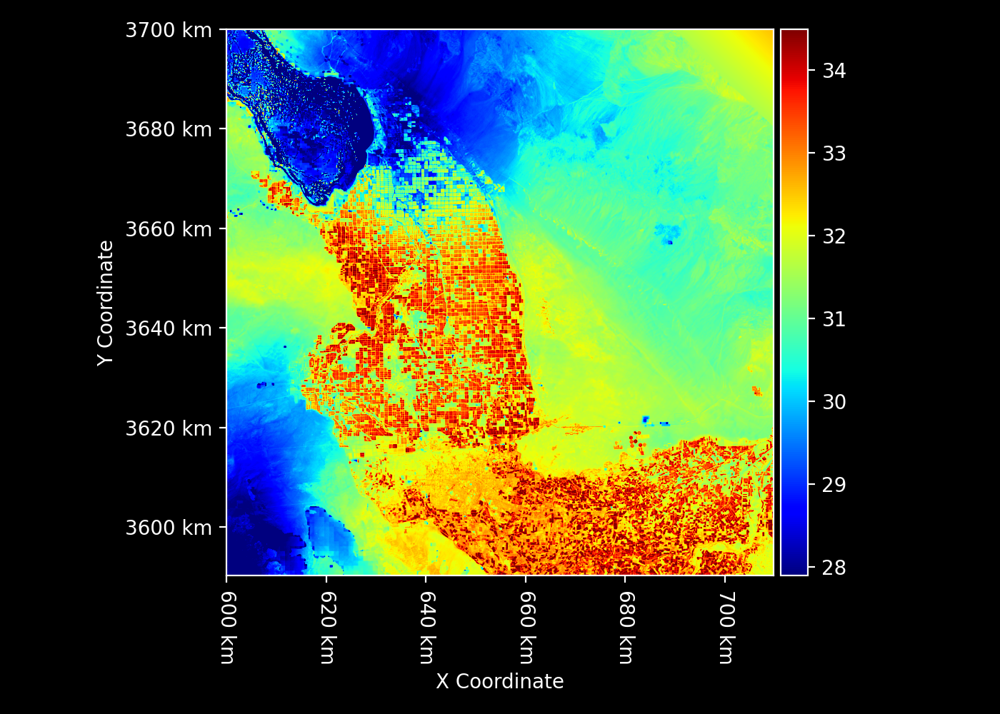

In [13]:
Ta_C_filename = "example_ECOSTRESS_input/ECOv002_L3T_MET_21485_013_11SPS_20220420T211350_0700_01/ECOv002_L3T_MET_21485_013_11SPS_20220420T211350_0700_01_Ta.tif"
Ta_C = Raster.open(Ta_C_filename)
Ta_C

/Users/halverso/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


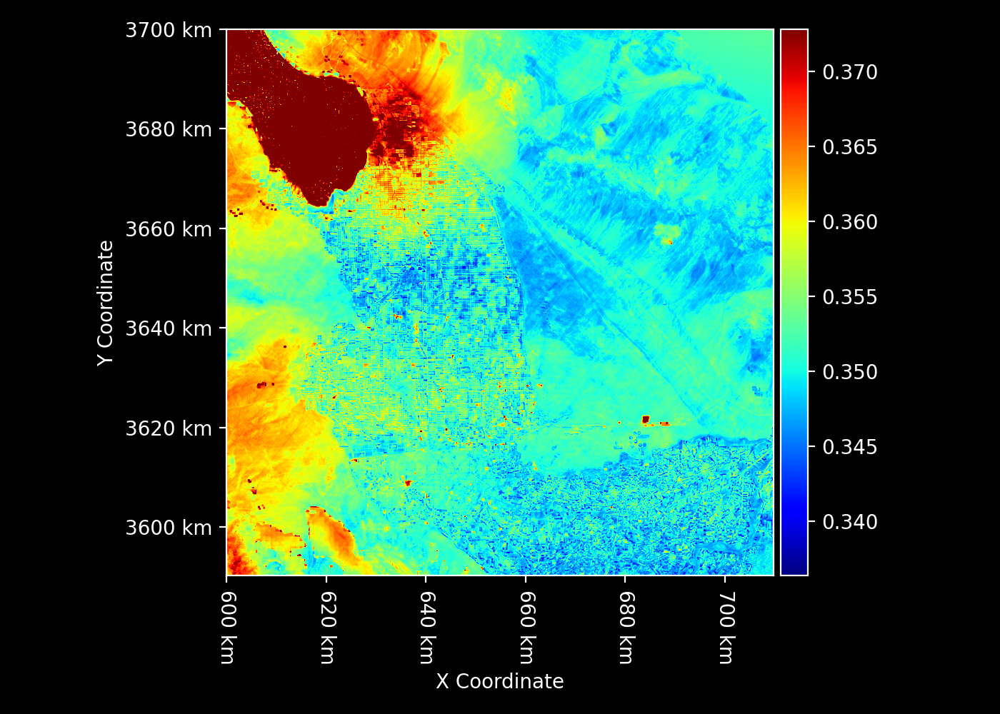

In [14]:
RH_filename = "example_ECOSTRESS_input/ECOv002_L3T_MET_21485_013_11SPS_20220420T211350_0700_01/ECOv002_L3T_MET_21485_013_11SPS_20220420T211350_0700_01_RH.tif"
RH = Raster.open(RH_filename)
RH

/Users/halverso/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


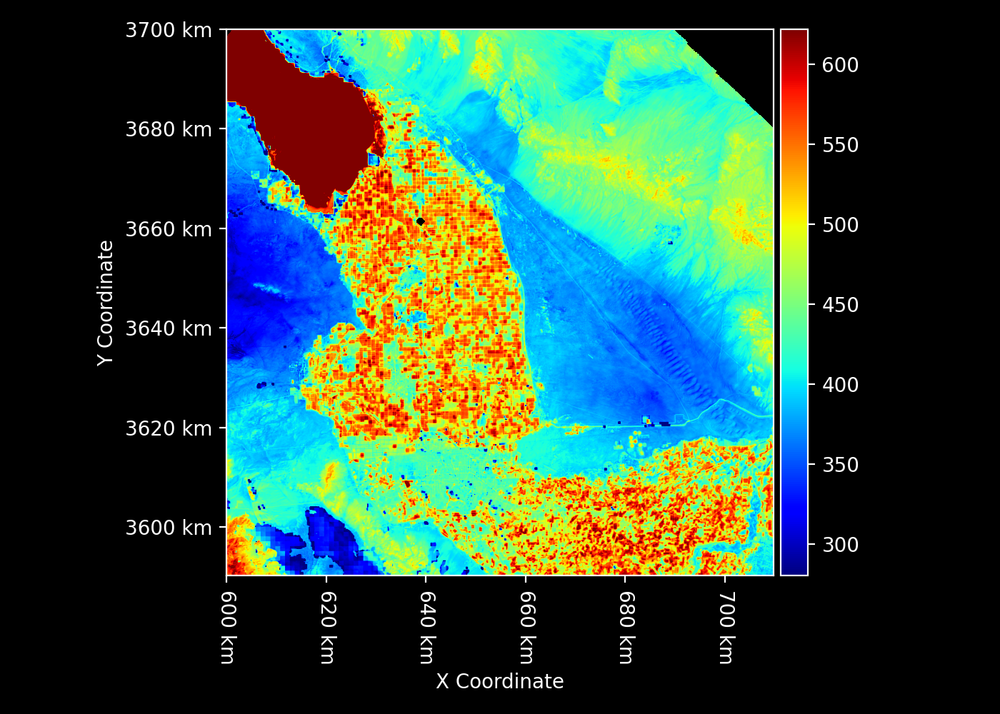

In [15]:
Rn_filename = "example_ECOSTRESS_input/ECOv002_L3T_SEB_21485_013_11SPS_20220420T211350_0700_01/ECOv002_L3T_SEB_21485_013_11SPS_20220420T211350_0700_01_Rn.tif"
Rn = Raster.open(Rn_filename)
Rn

/Users/halverso/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


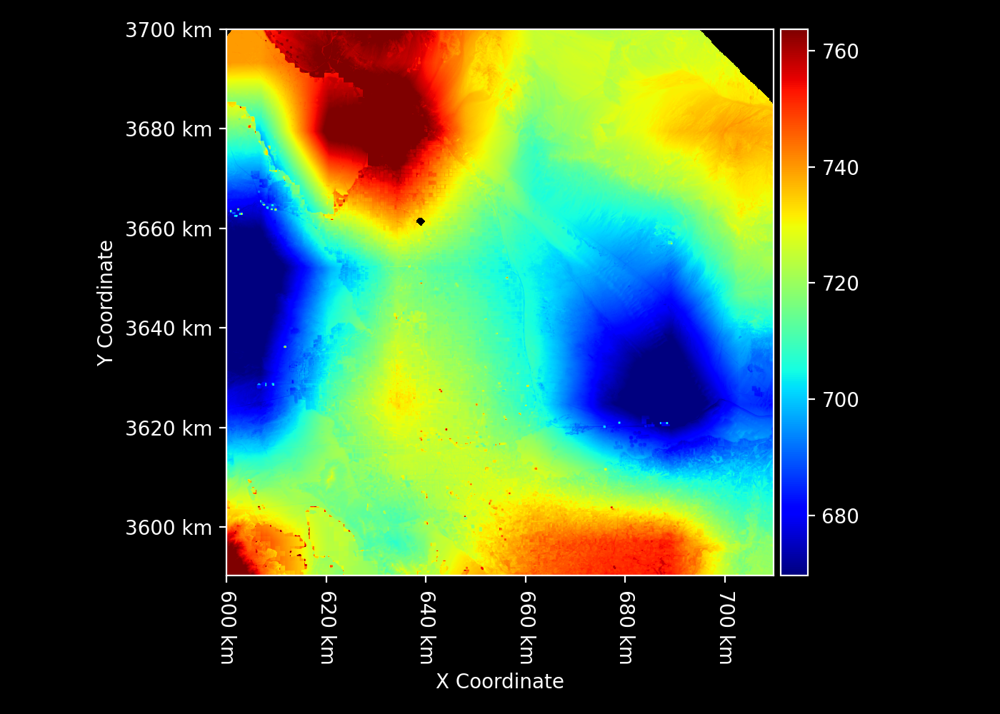

In [16]:
Rg_filename = "example_ECOSTRESS_input/ECOv002_L3T_SEB_21485_013_11SPS_20220420T211350_0700_01/ECOv002_L3T_SEB_21485_013_11SPS_20220420T211350_0700_01_Rg.tif"
Rg = Raster.open(Rg_filename)
Rg

/Users/halverso/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


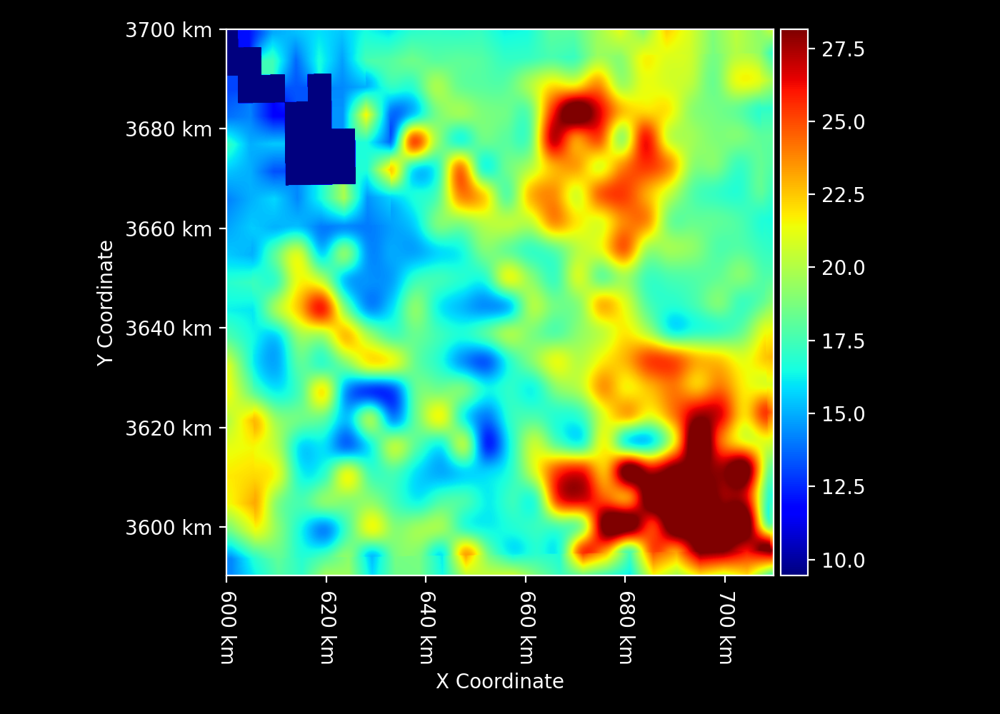

In [17]:
Topt = load_Topt(geometry)
Topt

/Users/halverso/Projects/ET-Sensitivity/raster/raster.py:4356: MatplotlibDeprecationWarning: Auto-close()ing of figures upon backend switching is deprecated since 3.8 and will be removed two minor releases later.  To suppress this warning, explicitly call plt.close('all') first.
  plt.switch_backend(prior_backend)


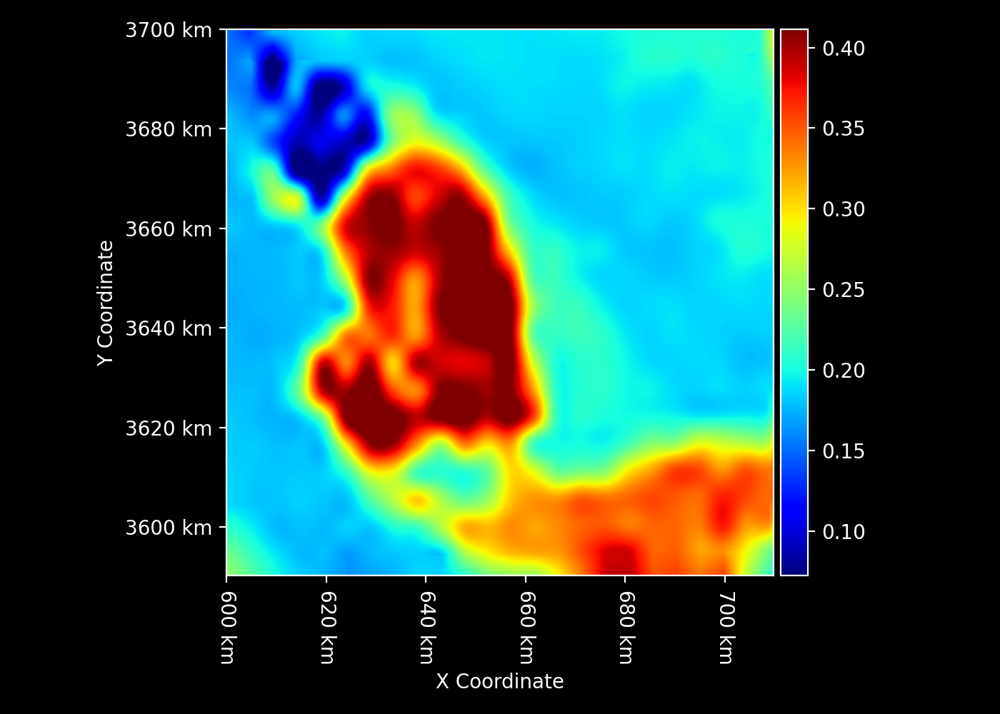

In [18]:
fAPARmax = load_fAPARmax(geometry)
fAPARmax

In [19]:
def reflectance_to_NDVI(NIR: Union[Raster, np.ndarray], red: Union[Raster, np.ndarray]) -> Union[Raster, np.ndarray]:
    return (NIR - red) / (NIR + red)

def reflectance_to_NDVI_table(input_df: pd.DataFrame) -> pd.DataFrame:
    NIR = input_df["NIR"]
    red = input_df["red"]
    NDVI = reflectance_to_NDVI(NIR, red)
    output_df = input_df.copy()
    output_df["NDVI"] = NDVI

    return output_df

def reflectance_to_PTJPL(input_df: pd.DataFrame) -> pd.DataFrame:
    return process_PTJPL_table(process_SEBAL_G_table(reflectance_to_NDVI_table(input_df)))

def reflectance_to_STIC(input_df: pd.DataFrame) -> pd.DataFrame:
    return process_STIC_table(process_SEBAL_G_table(reflectance_to_NDVI_table(input_df)))

In [20]:
input_df = pd.DataFrame({
    "hour_of_day": hour_of_day.flatten(),
    "lat": geometry.lat.flatten(),
    "lon": geometry.lon.flatten(),
    "NIR": NIR.flatten(),
    "red": red.flatten(),
    "ST_C": ST_C.flatten(),
    "EmisWB": emissivity.flatten(),
    "albedo": albedo.flatten(),
    "Ta_C": Ta_C.flatten(),
    "RH": RH.flatten(),
    "Rn": Rn.flatten(),
    "Rg": Rg.flatten(),
    "Topt": Topt.flatten(),
    "fAPARmax": fAPARmax.flatten()
})

ndvi = (input_df["NIR"] - input_df["red"])/(input_df["NIR"] + input_df["red"])

input_df["doy"] = doy

input_df = input_df.dropna()


In [21]:
# subset to NDVI > 0.1
veg_df = input_df[ndvi > 0.2]

sample_df = veg_df.sample(1000)
sample_df

/var/folders/hk/35_x93nx79vg1zmd2fy1vcbr0000gq/T/ipykernel_4139/3463966396.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  veg_df = input_df[ndvi > 0.2]


,hour_of_day,lat,lon,NIR,red,ST_C,EmisWB,albedo,Ta_C,RH,Rn,Rg,Topt,fAPARmax,doy
1992707,13.568635,32.620268,-114.928803,0.3406,0.1588,43.589996,0.972,0.143913,32.376972,0.349047,450.456512,700.822021,28.62,0.3585,110
1941061,13.573540,32.639865,-114.855233,0.3127,0.1041,44.630005,0.972,0.129749,32.491116,0.347464,450.801941,696.020203,27.33,0.3145,110
1910608,13.540684,32.659316,-115.348078,0.3393,0.1647,47.170013,0.968,0.162356,32.823921,0.349286,438.456146,722.813110,14.51,0.2978,110
1708400,13.543970,32.740100,-115.298780,0.4257,0.0351,28.350006,0.964,0.103182,34.138611,0.354805,608.800537,707.090637,17.19,0.4047,110
1554251,13.519882,32.806359,-115.660104,0.5321,0.0439,31.529999,0.962,0.142295,33.567204,0.354959,566.365662,715.003906,17.20,0.3734,110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2063881,13.521169,32.600952,-115.640793,0.3201,0.2040,47.550018,0.972,0.154353,32.225307,0.350125,427.843597,716.397827,19.07,0.2299,110
2330921,13.544896,32.489266,-115.284894,0.3946,0.0478,38.010010,0.968,0.114925,35.219410,0.344460,571.941406,741.739807,16.68,0.3250,110
1825684,13.528184,32.695738,-115.535568,0.3302,0.2174,40.510010,0.962,0.155550,32.050579,0.356973,489.868835,727.663513,18.24,0.3730,110
1587574,13.539548,32.789596,-115.365107,0.5656,0.0341,34.309998,0.950,0.145159,33.933929,0.350261,549.941528,715.040649,15.84,0.4022,110


(array([128.,  96.,  82.,  84.,  91.,  68.,  78., 121., 176.,  76.]),
 array([0.20046404, 0.27365919, 0.34685433, 0.42004948, 0.49324463,
        0.56643978, 0.63963493, 0.71283007, 0.78602522, 0.85922037,
        0.93241552]),
 <BarContainer object of 10 artists>)

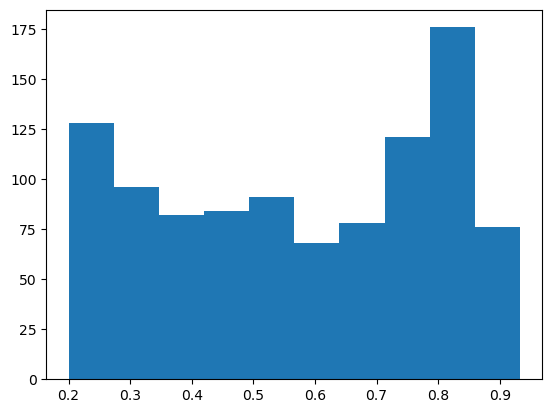

In [22]:
plt.hist((sample_df["NIR"] - sample_df["red"])/(sample_df["NIR"] + sample_df["red"]))

In [23]:
input_df = sample_df
input_variable = ["red","NIR"]
output_variable = ["NDVI"] 
forward_process = reflectance_to_NDVI_table
perturbation_process = np.random.multivariate_normal,
n = 100
perturbation_mean = None
perturbation_cov = None


In [24]:
n_input = len(input_variable)
n_output = len(output_variable)

input_std = np.nanstd(input_df[input_variable],axis=0)

if all(x == 0 for x in input_std):
    input_std = np.empty(n_input) * np.nan

# use diagonal (independent) standard deviations of the input variables if not given
if perturbation_cov is None:
    perturbation_cov = np.diag(input_std)

if perturbation_mean is None:
    perturbation_mean = np.zeros(n_input)


# forward process the unperturbed input
unperturbed_output_df = forward_process(input_df)
# calculate standard deviation of the output variable
output_std = np.nanstd(unperturbed_output_df[output_variable],axis=0)

if all(x == 0 for x in output_std):
    output_std = np.empty(n_output) * np.nan


In [25]:
def repeat_rows(df: pd.DataFrame, n: int) -> pd.DataFrame:
    return pd.DataFrame(np.repeat(df.values, n, axis=0), columns=df.columns)


In [26]:

# extract output variable from unperturbed output
unperturbed_output = unperturbed_output_df[output_variable]
# repeat unperturbed output
unperturbed_output = repeat_rows(unperturbed_output, n)


In [27]:
# generate input perturbation
input_perturbation = perturbation_process(perturbation_mean, perturbation_cov, n*len(input_df))
input_perturbation_std = input_perturbation / input_std

TypeError: 'tuple' object is not callable

In [ ]:
# copy input for perturbation
perturbed_input_df = input_df.copy()
# repeat input for perturbation
perturbed_input_df = repeat_rows(perturbed_input_df, n)
# extract input variable from repeated unperturbed input
unperturbed_input = perturbed_input_df[input_variable]
# add perturbation to input
perturbed_input_df[input_variable] = perturbed_input_df[input_variable] + input_perturbation
# extract perturbed input
perturbed_input = perturbed_input_df[input_variable]
# forward process the perturbed input
perturbed_output_df = forward_process(perturbed_input_df)
# extract output variable from perturbed output
perturbed_output = perturbed_output_df[output_variable]
# calculate output perturbation
output_perturbation = perturbed_output - unperturbed_output
output_perturbation_std = output_perturbation / output_std


In [ ]:

perturbed_input

In [ ]:
output_perturbation

In [ ]:

input_perturbation_df = pd.DataFrame(input_perturbation, columns=[s+"_perturbation" for s in input_variable])
input_perturbation_std_df = pd.DataFrame(input_perturbation_std, columns=[s+"_perturbation_std" for s in input_variable])

perturbed_input.columns = [s+"_perturbed" for s in input_variable]
output_perturbation.columns = [s+"_perturbation" for s in output_variable]
output_perturbation_std.columns = [s+"_perturbation_std" for s in output_variable]
perturbed_output.columns = [s+"_perturbed" for s in output_variable]

results_df = pd.concat([unperturbed_input,
                        input_perturbation_df,
                        input_perturbation_std_df,
                        perturbed_input,
                        unperturbed_output,
                        output_perturbation,
                        output_perturbation_std,
                        perturbed_output], axis=1)


In [ ]:
output_df = joint_perturbed_run(
    input_df=sample_df, 
    input_variable=["red","NIR"], 
    output_variable=["NDVI"], 
    forward_process=reflectance_to_NDVI_table,
    perturbation_mean=np.zeros(2),
    perturbation_cov=np.eye(2)*0.03**2
)


In [ ]:
output_df = output_df[(output_df.NDVI_perturbed > -1) & (output_df.NDVI_perturbed < 1)]
output_df = output_df[(output_df.NIR_perturbed > 0) & (output_df.NIR_perturbed < 1)]
output_df.to_csv("vnir_to_NDVI_sensitivity.csv")


In [ ]:

ax = sns.regplot(
    x="NIR_perturbation",
    y="NDVI_perturbation",
    data=output_df,
    scatter_kws={
        "alpha": 0.1,
        "s": 1
    },
    line_kws={
        "color": "black"
    }
)

ax.set(
    xlabel="Error in Near-Infrared Surface Reflectance",
    ylabel="Error in Vegetation Index" 
)

ax.set_title("NIR to NDVI Sensitivity")

In [ ]:
output_df

In [ ]:
#sns.set_palette("vlag")
#sns.scatterplot(x="NIR_perturbation", y="red_perturbation", hue="NDVI_perturbation", s=2, data=output_df) # s is a size of marker 
plt.scatter(x="NIR_perturbation", y="red_perturbation", c="NDVI_perturbation", s=2, data=output_df, cmap='bwr',clim=(-0.8,0.8)) # s is a size of marker 
plt.colorbar()


In [ ]:
ax = sns.regplot(
    x="red_perturbation",
    y="NDVI_perturbation",
    data=output_df,
    scatter_kws={
        "alpha": 0.1,
        "s": 1
    },
    line_kws={
        "color": "black"
    }
)

ax.set(
    xlabel="Error in Red Surface Reflectance",
    ylabel="Error in Vegetation Index" 
)

ax.set_title("Red to NDVI Sensitivity")

In [ ]:
output_df = joint_perturbed_run(
    input_df=sample_df, 
    input_variable=["NIR","red"], 
    output_variable=["LE"], 
    forward_process=reflectance_to_PTJPL,
    perturbation_mean=np.zeros(2),
    perturbation_cov=np.eye(2)*0.03**2
)

# output_df = output_df[(output_df.LE_perturbed > -1) & (output_df.LE_perturbed < 1)]
output_df = output_df[(output_df.NIR_perturbed > 0) & (output_df.NIR_perturbed < 1)]
output_df.to_csv("vnir_to_LE_PTJPL_sensitivity.csv")

In [ ]:

print(np.nanstd(output_df.LE_perturbation))

ax = sns.regplot(
    x="NIR_perturbation",
    y="LE_perturbation",
    data=output_df,
    scatter_kws={
        "alpha": 0.1,
        "s": 1
    },
    line_kws={
        "color": "black"
    }
)

ax.set(
    xlabel="Error in Near-Infrared Surface Reflectance",
    ylabel="Error in Latent Heat Flux" 
)

ax.set_title("NIR to PTJPL LE Sensitivity")

In [ ]:
ax = sns.regplot(
    x="red_perturbation",
    y="LE_perturbation",
    data=output_df,
    scatter_kws={
        "alpha": 0.1,
        "s": 1
    },
    line_kws={
        "color": "black"
    }
)

ax.set(
    xlabel="Error in Red Surface Reflectance",
    ylabel="Error in Latent Heat Flux" 
)

ax.set_title("Red Reflectance to PTJPL LE Sensitivity")

In [ ]:
output_df = joint_perturbed_run(
    input_df=sample_df, 
    input_variable=["NIR","red"], 
    output_variable=["LE"], 
    forward_process=reflectance_to_STIC,
    perturbation_mean=np.zeros(2),
    perturbation_cov=np.eye(2)*0.03**2
)

# output_df = output_df[(output_df.LE_perturbed > -1) & (output_df.LE_perturbed < 1)]
output_df = output_df[(output_df.NIR_perturbed > 0) & (output_df.NIR_perturbed < 1)]
output_df.to_csv("vnir_to_LE_STIC_sensitivity.csv")

In [ ]:

print(np.nanstd(output_df.LE_perturbation))

ax = sns.regplot(
    x="NIR_perturbation",
    y="LE_perturbation",
    data=output_df,
    scatter_kws={
        "alpha": 0.1,
        "s": 1
    },
    line_kws={
        "color": "black"
    }
)

ax.set(
    xlabel="Error in Near-Infrared Surface Reflectance",
    ylabel="Error in Latent Heat Flux" 
)

ax.set_title("NIR to STIC LE Sensitivity")

In [ ]:

ax = sns.regplot(
    x="red_perturbation",
    y="LE_perturbation",
    data=output_df,
    scatter_kws={
        "alpha": 0.1,
        "s": 1
    },
    line_kws={
        "color": "black"
    }
)

ax.set(
    xlabel="Error in Red Surface Reflectance",
    ylabel="Error in Latent Heat Flux" 
)

ax.set_title("Red Reflectance to STIC LE Sensitivity")